In [ ]:
import geopandas as gpd
import pandas as pd


from shapely.ops import unary_union, linemerge
from shapely.geometry import Point, LineString, MultiLineString
from shapely.geometry import mapping


import networkx as nx


import folium
from folium import Map, GeoJson


import json
import mapillary as mly




### Berlin einlesen für Proof of concept

<Axes: >

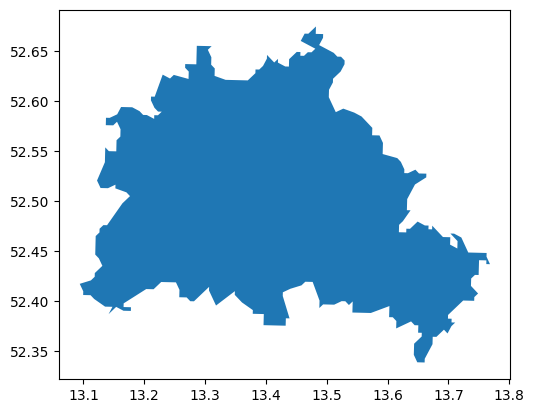

In [86]:
bland = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json")
bland_fil=bland[bland["id"].isin(["DE-BE"])]
bland_fil.plot()

### netzwerk einlesen

In [87]:
#highways=gpd.read_file("../preprocessing/processed_osm_files/processed_major_highways_germany_250528.geojson.gz")

# use not only the major highways, but all highways for this
highways=gpd.read_file("../preprocessing/processed_osm_files/processed_almostall_highways_germany_250528.geojson.gz")


In [88]:
# set defaults
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:urban"), "maxspeed"] = "50"
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:rural"), "maxspeed"] = "100"
highways

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
0,92,residential,30,None,None,None,None,Eigenheimstraße,None,"LINESTRING (13.73698 51.01663, 13.73752 51.016..."
1,93,residential,30,None,None,None,None,Eigenheimberg,None,"LINESTRING (13.73939 51.01669, 13.73967 51.016..."
2,99,tertiary,None,None,None,None,None,None,None,"LINESTRING (11.36639 48.17411, 11.36643 48.174..."
3,100,secondary,100,None,None,None,None,None,None,"LINESTRING (11.33037 48.1801, 11.33032 48.1801..."
4,103,residential,5,None,None,None,None,Altmockritz,None,"LINESTRING (13.74127 51.01615, 13.74149 51.016..."
...,...,...,...,...,...,...,...,...,...,...
11045659,1390550454,service,None,None,None,None,None,None,None,"LINESTRING (13.56334 52.53415, 13.56334 52.534..."
11045660,1390550455,service,None,None,None,None,None,None,None,"LINESTRING (13.56304 52.53414, 13.56303 52.534..."
11045661,1390550456,service,None,None,None,None,None,None,None,"LINESTRING (13.56203 52.53407, 13.56204 52.534..."
11045662,1390550457,service,None,None,None,None,None,None,None,"LINESTRING (13.56165 52.53405, 13.56165 52.534..."


In [89]:
## nur Berlin
highways_in_bl = gpd.clip(highways, bland_fil)
highways_in_bl

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
446316,24380018,residential,30,None,None,None,None,Liebknechtstraße,None,"LINESTRING (13.65769 52.33877, 13.65785 52.339..."
8849268,865871690,service,10,None,None,None,None,Wernsdorfer Straße,None,"LINESTRING (13.65925 52.33881, 13.65937 52.338..."
8559717,800638930,service,None,None,None,None,None,None,None,"LINESTRING (13.66077 52.33952, 13.66065 52.339..."
171179,10587008,unclassified,30,None,None,None,None,Moßkopfring,None,"LINESTRING (13.64705 52.34252, 13.64697 52.342..."
9385887,969836864,service,None,None,None,None,None,None,None,"LINESTRING (13.64681 52.34196, 13.64756 52.34185)"
...,...,...,...,...,...,...,...,...,...,...
6625124,389304639,track,None,None,None,None,None,None,None,"LINESTRING (13.47607 52.67116, 13.47587 52.671..."
8591380,806491145,track,None,None,None,None,None,None,None,"LINESTRING (13.47607 52.67116, 13.47616 52.671..."
4721567,197689751,track,None,None,None,None,None,None,None,"LINESTRING (13.48214 52.67267, 13.4821 52.6727..."
8907239,881562217,track,None,None,None,None,None,None,None,"LINESTRING (13.4821 52.67272, 13.48215 52.67274)"


<Axes: >

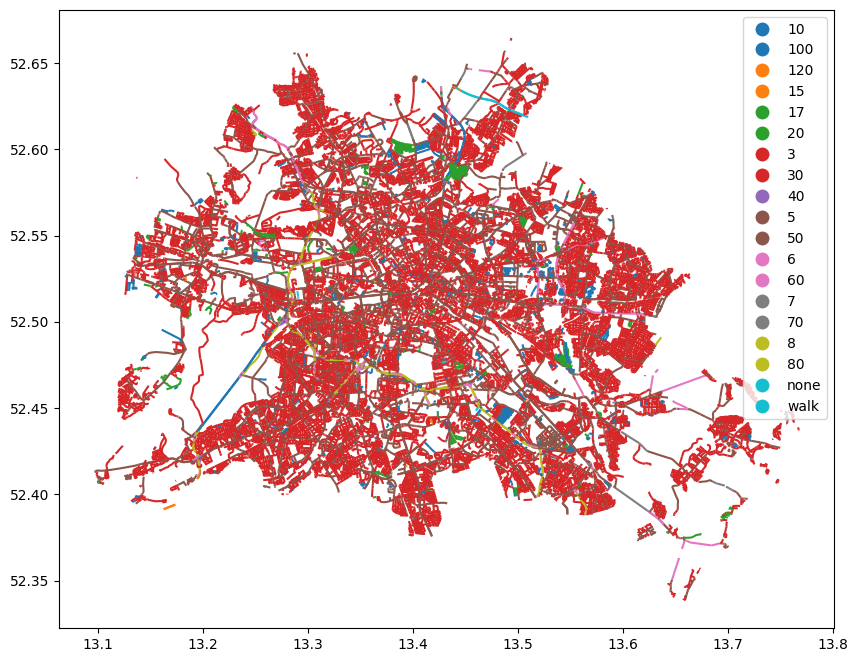

In [90]:
highways_in_bl.plot(column="maxspeed", legend=True, figsize=(10, 10))

<Axes: >

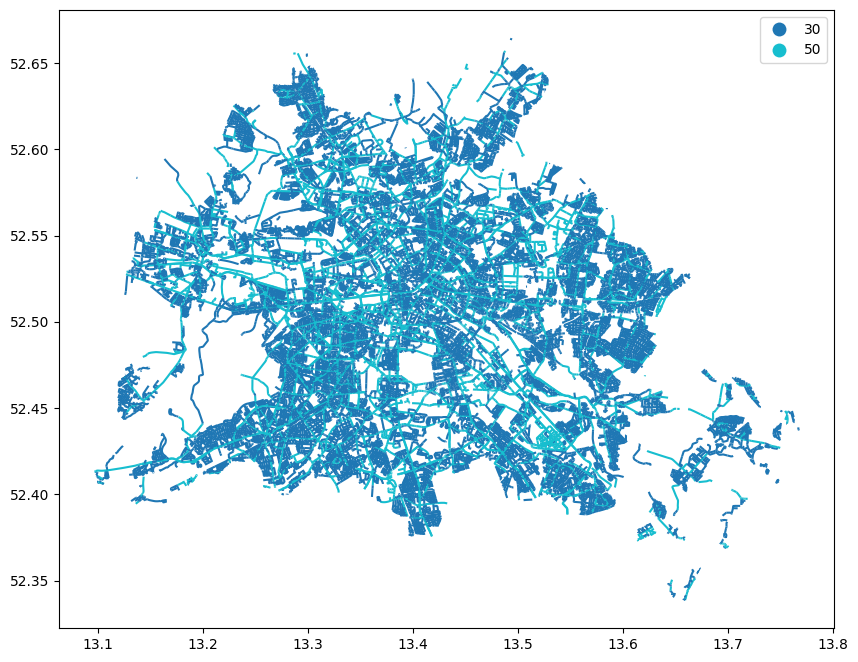

In [91]:
#nur 30 und 50 km/h

highways_in_bl_3050=highways_in_bl[highways_in_bl.maxspeed.isin(["30", "50"])].copy()
highways_in_bl_3050.plot(column="maxspeed", legend=True, figsize=(10, 10))

In [92]:
# mapillary map feature data: traffic signs einlesen

In [93]:
mapillary_trafficsigns = gpd.read_parquet("../preprocessing/mapillary_map-feature-data_berlin_2025-06-07.parquet")
mapillary_trafficsigns

,geometry,first_seen_at,id,last_seen_at,value
0,POINT (13.09673 52.41332),2015-11-18,1391186787929268,2015-11-18,information--general-directions--g1
1,POINT (13.10878 52.41408),2015-11-18,1178445959261416,2016-03-25,warning--wild-animals--g1
2,POINT (13.0971 52.41321),2017-06-25,1696373427217755,2024-05-09,regulatory--no-parking--g1
3,POINT (13.10394 52.40669),2019-06-11,395689434851066,2019-06-11,regulatory--no-parking--g1
4,POINT (13.0961 52.41325),2015-11-18,483876509493610,2015-11-18,regulatory--maximum-speed-limit-50--g1
...,...,...,...,...,...
348888,POINT (13.75132 52.41046),2020-05-09,940194036739663,2021-09-14,regulatory--keep-right--g1
348889,POINT (13.75013 52.40777),2019-06-30,1260813321017851,2021-09-14,regulatory--shared-path-pedestrians-and-bicycl...
348890,POINT (13.75327 52.41479),2017-05-14,304906801194963,2023-04-10,regulatory--no-parking--g1
348891,POINT (13.75086 52.41488),2022-01-10,934980713814996,2022-01-10,regulatory--priority-road--g1


In [94]:
# Tempo 30 Schilder in Berlin
mapillary_trafficsigns[mapillary_trafficsigns.value=="regulatory--maximum-speed-limit-30--g1"]

,geometry,first_seen_at,id,last_seen_at,value
16,POINT (13.09577 52.41317),2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1
19,POINT (13.0984 52.41372),2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1
58,POINT (13.09609 52.41348),2018-05-05,469515337590994,2018-05-05,regulatory--maximum-speed-limit-30--g1
70,POINT (13.10911 52.41425),2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1
80,POINT (13.09625 52.41346),2018-05-05,2962802007265985,2018-05-05,regulatory--maximum-speed-limit-30--g1
...,...,...,...,...,...
348827,POINT (13.75357 52.4149),2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1
348835,POINT (13.73848 52.41555),2023-04-10,917828369425950,2023-04-10,regulatory--maximum-speed-limit-30--g1
348844,POINT (13.75313 52.41399),2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1
348871,POINT (13.74266 52.41539),2023-04-10,701865428384592,2023-04-10,regulatory--maximum-speed-limit-30--g1


In [95]:
from datetime import datetime

def months_between(date1, date2):
    d1 = datetime.strptime(date1, "%Y-%m-%d")
    d2 = datetime.strptime(date2, "%Y-%m-%d")
    return abs((d2.year - d1.year) * 12 + d2.month - d1.month)

df_6months = mapillary_trafficsigns[
    mapillary_trafficsigns.apply(lambda row: months_between(row['first_seen_at'], row['last_seen_at']) >= 6, axis=1)
]
df_6months_30=df_6months[df_6months.value == "regulatory--maximum-speed-limit-30--g1"]

<Axes: >

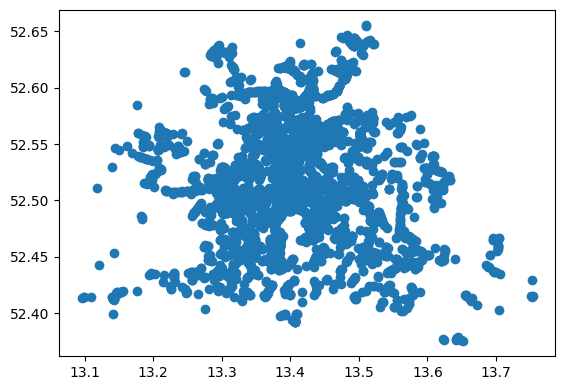

In [96]:
df_6months_30.plot()

In [97]:
df_6months_30.explore(
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at"]
)

In [98]:
df_6months_30_buffered = df_6months_30.to_crs(25833).copy()
df_6months_30_buffered["geometry"] = df_6months_30_buffered.geometry.buffer(30)
df_6months_30_buffered = df_6months_30_buffered.to_crs(df_6months_30.crs)
df_6months_30_buffered

,geometry,first_seen_at,id,last_seen_at,value
16,"POLYGON ((13.09621 52.41317, 13.09621 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1
19,"POLYGON ((13.09884 52.41373, 13.09884 52.4137,...",2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1
70,"POLYGON ((13.10955 52.41425, 13.10955 52.41423...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1
99,"POLYGON ((13.09905 52.41373, 13.09905 52.41371...",2018-03-25,514100952934909,2022-06-12,regulatory--maximum-speed-limit-30--g1
483,"POLYGON ((13.11878 52.5112, 13.11878 52.51118,...",2020-04-18,561519231920106,2023-09-26,regulatory--maximum-speed-limit-30--g1
...,...,...,...,...,...
348081,"POLYGON ((13.70513 52.40236, 13.70513 52.40234...",2020-09-15,193357762649438,2022-02-26,regulatory--maximum-speed-limit-30--g1
348735,"POLYGON ((13.75274 52.42939, 13.75274 52.42936...",2015-07-01,303813858048031,2025-02-11,regulatory--maximum-speed-limit-30--g1
348827,"POLYGON ((13.75401 52.4149, 13.75401 52.41488,...",2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1
348844,"POLYGON ((13.75357 52.414, 13.75357 52.41397, ...",2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1


In [99]:
# # Spatial join: find highways_in_bl segments that intersect with buffered 30-signs
# intersected = gpd.sjoin(highways_in_bl, df_6months_30_buffered, how="inner", predicate="intersects")

# # Check if intersected highways have maxspeed == "30"
# intersected_30 = intersected[intersected["maxspeed"] == "30"]

# intersected_30

In [100]:
# Prüfe, ob ein highways_in_bl Segment mit maxspeed==30 oder maxspeed_conditional==30 ein df_6months_30_buffered-Polygon schneidet
def has_30_intersection(row, highways_gdf):
    # highways_gdf: nur maxspeed==30 oder maxspeed_conditional==30
    return highways_gdf.intersects(row.geometry).any()

# Filter für relevante Straßen
highways_30 = highways_in_bl[
    (highways_in_bl["maxspeed"] == "30") |
    (highways_in_bl["maxspeed_conditional"].astype(str).str.startswith("30 @"))
]

# Neue Spalte: True, falls mind. ein Segment schneidet
df_6months_30_buffered["has_30_intersection"] = df_6months_30_buffered.apply(
    lambda row: has_30_intersection(row, highways_30), axis=1
)

df_6months_30_buffered

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,"POLYGON ((13.09621 52.41317, 13.09621 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
19,"POLYGON ((13.09884 52.41373, 13.09884 52.4137,...",2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1,True
70,"POLYGON ((13.10955 52.41425, 13.10955 52.41423...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1,True
99,"POLYGON ((13.09905 52.41373, 13.09905 52.41371...",2018-03-25,514100952934909,2022-06-12,regulatory--maximum-speed-limit-30--g1,False
483,"POLYGON ((13.11878 52.5112, 13.11878 52.51118,...",2020-04-18,561519231920106,2023-09-26,regulatory--maximum-speed-limit-30--g1,False
...,...,...,...,...,...,...
348081,"POLYGON ((13.70513 52.40236, 13.70513 52.40234...",2020-09-15,193357762649438,2022-02-26,regulatory--maximum-speed-limit-30--g1,False
348735,"POLYGON ((13.75274 52.42939, 13.75274 52.42936...",2015-07-01,303813858048031,2025-02-11,regulatory--maximum-speed-limit-30--g1,False
348827,"POLYGON ((13.75401 52.4149, 13.75401 52.41488,...",2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1,False
348844,"POLYGON ((13.75357 52.414, 13.75357 52.41397, ...",2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1,False


In [101]:
df_6months_30_buffered.has_30_intersection.value_counts()

has_30_intersection
True     4244
False     274
Name: count, dtype: int64

In [102]:
df_6months_30_buffered_recent = df_6months_30_buffered[df_6months_30_buffered["last_seen_at"] > "2024-01-01"]
df_6months_30_buffered_recent

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,"POLYGON ((13.09621 52.41317, 13.09621 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
70,"POLYGON ((13.10955 52.41425, 13.10955 52.41423...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1,True
769,"POLYGON ((13.12186 52.44272, 13.12185 52.4427,...",2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False
1108,"POLYGON ((13.14457 52.54623, 13.14457 52.54621...",2022-04-30,388251449851192,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
1242,"POLYGON ((13.15095 52.54484, 13.15095 52.54481...",2016-03-29,297942131929354,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
...,...,...,...,...,...,...
347772,"POLYGON ((13.69029 52.44059, 13.69029 52.44057...",2024-03-13,1120416395813963,2025-02-11,regulatory--maximum-speed-limit-30--g1,True
347901,"POLYGON ((13.69801 52.43629, 13.698 52.43626, ...",2022-08-07,429020029191496,2025-05-20,regulatory--maximum-speed-limit-30--g1,True
347904,"POLYGON ((13.70613 52.43419, 13.70613 52.43416...",2016-09-28,3604892966282638,2025-02-11,regulatory--maximum-speed-limit-30--g1,True
347969,"POLYGON ((13.6999 52.43585, 13.6999 52.43583, ...",2022-01-10,4379890498783553,2025-02-11,regulatory--maximum-speed-limit-30--g1,True


In [103]:
import matplotlib.colors as mcolors

cmap = mcolors.ListedColormap(["red", "green"])
df_6months_30_buffered_recent.explore(
    column="has_30_intersection",
    cmap=cmap,
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at", "has_30_intersection"]
)

In [104]:
df_6months_30_buffered_recent_false=df_6months_30_buffered_recent[df_6months_30_buffered_recent.has_30_intersection== False]

In [105]:
df_6months_30_buffered_recent_false.explore(
    color="red",
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at", "has_30_intersection"]
)

In [106]:
df_6months_30_buffered_recent_false

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,"POLYGON ((13.09621 52.41317, 13.09621 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
769,"POLYGON ((13.12186 52.44272, 13.12185 52.4427,...",2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False
9468,"POLYGON ((13.19396 52.43379, 13.19396 52.43377...",2017-03-19,2600714330230139,2025-02-05,regulatory--maximum-speed-limit-30--g1,False
25677,"POLYGON ((13.26153 52.43611, 13.26153 52.43609...",2023-06-12,239352242174087,2024-07-31,regulatory--maximum-speed-limit-30--g1,False
26070,"POLYGON ((13.26167 52.43609, 13.26167 52.43606...",2023-06-12,239352312174080,2024-07-31,regulatory--maximum-speed-limit-30--g1,False
...,...,...,...,...,...,...
346699,"POLYGON ((13.64959 52.37586, 13.64959 52.37584...",2017-05-14,289185886209346,2024-10-16,regulatory--maximum-speed-limit-30--g1,False
347444,"POLYGON ((13.70387 52.45957, 13.70387 52.45954...",2023-11-29,332942332936103,2025-02-11,regulatory--maximum-speed-limit-30--g1,False
347448,"POLYGON ((13.70435 52.46645, 13.70435 52.46643...",2023-05-28,1895952417444075,2024-08-29,regulatory--maximum-speed-limit-30--g1,False
347486,"POLYGON ((13.70441 52.4667, 13.70441 52.46668,...",2023-05-28,1895952414110742,2024-08-29,regulatory--maximum-speed-limit-30--g1,False


In [108]:
## retrieve the image ID for the map features

In [ ]:
### this takes 0.5s per image ID, TODO: would be nice to have tqdm at some point so see the progress


# Load the token from JSON config file
with open("../preprocessing/config_mapillary_privat.json", "r") as f:
    config = json.load(f)

# Set the token
access_token = config["ACCESS_TOKEN"]
mly.interface.set_access_token(access_token)



def get_image_id(map_feature_id):
    feature_str = mly.interface.feature_from_key(key=str(map_feature_id))
    feature = json.loads(feature_str)
    images = feature["features"]["properties"]["images"]["data"]
    return images[-1]["id"] if images else None

df_6months_30_buffered_recent_false["image_id"] = df_6months_30_buffered_recent_false["id"].apply(get_image_id)


Requesting GET to https://graph.mapillary.com/1696254303896334/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images
Response 200 OK received in 334ms
Requesting GET to https://graph.mapillary.com/909700103151725/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images
Response 200 OK received in 528ms
Requesting GET to https://graph.mapillary.com/2600714330230139/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images
Response 200 OK received in 419ms
Requesting GET to https://graph.mapillary.com/239352242174087/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images
Response 200 OK received in 555ms
Requesting GET to https://graph.mapillary.com/239352312174080/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images
Response 200 OK received in 370ms
Requesting GET to https://graph.mapillary.com/837077643825545/?fields=first_seen_at,last_seen_at,object_value,object_type,geometry,images


/home/simon/unfallkarte/preprocessing/unfallkarte_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [110]:
df_6months_30_buffered_recent_false

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection,image_id
16,"POLYGON ((13.09621 52.41317, 13.09621 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False,2867261640181054
769,"POLYGON ((13.12186 52.44272, 13.12185 52.4427,...",2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False,875171593046170
9468,"POLYGON ((13.19396 52.43379, 13.19396 52.43377...",2017-03-19,2600714330230139,2025-02-05,regulatory--maximum-speed-limit-30--g1,False,789603061927825
25677,"POLYGON ((13.26153 52.43611, 13.26153 52.43609...",2023-06-12,239352242174087,2024-07-31,regulatory--maximum-speed-limit-30--g1,False,3416161058650342
26070,"POLYGON ((13.26167 52.43609, 13.26167 52.43606...",2023-06-12,239352312174080,2024-07-31,regulatory--maximum-speed-limit-30--g1,False,810244850235708
...,...,...,...,...,...,...,...
346699,"POLYGON ((13.64959 52.37586, 13.64959 52.37584...",2017-05-14,289185886209346,2024-10-16,regulatory--maximum-speed-limit-30--g1,False,823553691912666
347444,"POLYGON ((13.70387 52.45957, 13.70387 52.45954...",2023-11-29,332942332936103,2025-02-11,regulatory--maximum-speed-limit-30--g1,False,384752730760330
347448,"POLYGON ((13.70435 52.46645, 13.70435 52.46643...",2023-05-28,1895952417444075,2024-08-29,regulatory--maximum-speed-limit-30--g1,False,560538692940983
347486,"POLYGON ((13.70441 52.4667, 13.70441 52.46668,...",2023-05-28,1895952414110742,2024-08-29,regulatory--maximum-speed-limit-30--g1,False,560538692940983


In [111]:
sc4_poly=df_6months_30_buffered_recent_false.copy()


In [112]:
sc4_poly.to_file("scenario4_tempo30missing_polys.fgb", driver="FlatGeobuf")

In [113]:
sc4_centroids = sc4_poly.copy()
sc4_centroids=sc4_centroids.to_crs(25832)
sc4_centroids["geometry"] = sc4_centroids.geometry.centroid
sc4_centroids=sc4_centroids.to_crs(4326)

sc4_centroids

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection,image_id
16,POINT (13.09577 52.41317),2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False,2867261640181054
769,POINT (13.12141 52.44272),2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False,875171593046170
9468,POINT (13.19352 52.43378),2017-03-19,2600714330230139,2025-02-05,regulatory--maximum-speed-limit-30--g1,False,789603061927825
25677,POINT (13.26109 52.43611),2023-06-12,239352242174087,2024-07-31,regulatory--maximum-speed-limit-30--g1,False,3416161058650342
26070,POINT (13.26123 52.43608),2023-06-12,239352312174080,2024-07-31,regulatory--maximum-speed-limit-30--g1,False,810244850235708
...,...,...,...,...,...,...,...
346699,POINT (13.64915 52.37586),2017-05-14,289185886209346,2024-10-16,regulatory--maximum-speed-limit-30--g1,False,823553691912666
347444,POINT (13.70343 52.45957),2023-11-29,332942332936103,2025-02-11,regulatory--maximum-speed-limit-30--g1,False,384752730760330
347448,POINT (13.70391 52.46645),2023-05-28,1895952417444075,2024-08-29,regulatory--maximum-speed-limit-30--g1,False,560538692940983
347486,POINT (13.70397 52.4667),2023-05-28,1895952414110742,2024-08-29,regulatory--maximum-speed-limit-30--g1,False,560538692940983


In [114]:
sc4_centroids.to_file("scenario4_tempo30missing_points.fgb", driver="FlatGeobuf")

In [115]:
def fgb_to_pmtiles_dual_layer(points_fgb, polys_fgb, output_pmtiles, layer_name):
    import subprocess
    from pathlib import Path

    tmp_points = "tmp_points.pmtiles"
    tmp_polys = "tmp_polys.pmtiles"

    subprocess.run([
        "tippecanoe", "-o", tmp_points,
        f"--layer={layer_name}-points",
        "--minimum-zoom=6", "--maximum-zoom=14",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        "--drop-densest-as-needed",
        "--drop-rate=0",
        str(Path(points_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tippecanoe", "-o", tmp_polys,
        f"--layer={layer_name}-polys",
        "--minimum-zoom=14", "--maximum-zoom=15",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        str(Path(polys_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tile-join", "--force", "-o", str(Path(output_pmtiles).resolve()),
        tmp_points, tmp_polys
    ], check=True)

    print("✅ Combined PMTiles created")


In [116]:
fgb_to_pmtiles_dual_layer(
    points_fgb="scenario4_tempo30missing_points.fgb",
    polys_fgb="scenario4_tempo30missing_polys.fgb",
    output_pmtiles="scenario4_tempo30missing.pmtiles",
    layer_name="scenario4"
    )

detected indexed FlatGeobuf: assigning feature IDs by sequence
157 features, 7354 bytes of geometry and attributes, 10416 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.9%  14/8797/5375  
detected indexed FlatGeobuf: assigning feature IDs by sequence
157 features, 37754 bytes of geometry and attributes, 10404 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.9%  15/17606/10732  


✅ Combined PMTiles created
